# LOAD THE ROAD DAMAGE DATASET FROM ROBOFLOW

In [1]:
# Step 1: Install the Roboflow library (the '-q' makes the output quiet)
!pip install -q roboflow

from roboflow import Roboflow

# IMPORTANT: Replace "YOUR_PRIVATE_API_KEY" with your actual key from Roboflow settings.
rf = Roboflow(api_key="RU8G8GzIKmBzWpNv2XvH")

# This part is correct and points to the public dataset you want
project = rf.workspace("road-damage-detection-ds22n").project("road-damage-dataset-8jvz5")
dataset = project.version(2).download("coco")

# This line will print the location where your dataset was downloaded
print(f"Dataset downloaded to: {dataset.location}")

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 88.7/88.7 kB 6.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 6.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.9/49.9 MB 18.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 66.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.2/4.2 MB 74.0 MB/s eta 0:00:00
loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to Road-Damage-Dataset-2 in coco:: 100%|██████████| 4909/4909 [00:01<00:00, 4232.48it/s]


Dataset downloaded to: /content/Road-Damage-Dataset-2


# IMPORT AND LOAD DETR MODEL

In [2]:
# Step 1: Install the necessary libraries from Hugging Face
# The '-q' flag makes the installation quiet
print("Installing transformers library...")
!pip install -q transformers

Installing transformers library...


In [3]:
import json
import os

# Path to your training annotations
train_ann_file = os.path.join(dataset.location, "train", "_annotations.coco.json")

# Load the annotation file
with open(train_ann_file, 'r') as f:
    coco_data = json.load(f)

# Get the categories section
categories = coco_data['categories']
num_actual_classes = len(categories)

print(f"The dataset actually contains {num_actual_classes} classes.")
print("They are:")
for category in categories:
    print(f"  ID: {category['id']}, Name: {category['name']}")

The dataset actually contains 9 classes.
They are:
  ID: 0, Name: Pothole-Cracks
  ID: 1, Name: Alligator
  ID: 2, Name: Edge Cracking
  ID: 3, Name: Lateral-Crack
  ID: 4, Name: Longitudinal-Crack
  ID: 5, Name: Ravelling
  ID: 6, Name: Rutting
  ID: 7, Name: Striping
  ID: 8, Name: pothole


In [4]:
import json
import os
from transformers import DetrImageProcessor, DetrForObjectDetection

# --- Define the Model Checkpoint ---
checkpoint = "facebook/detr-resnet-50"
print(f"Loading checkpoint: '{checkpoint}'")

# --- Load the Image Processor ---
# This line was missing from the previous replacement. We are adding it back here.
image_processor = DetrImageProcessor.from_pretrained(checkpoint)
print("\nImage Processor loaded successfully.")

# --- Dynamically Determine the Number of Classes ---
# Path to your training annotations
train_ann_file = os.path.join(dataset.location, "train", "_annotations.coco.json")

# Load the annotation file to find out the number of classes
with open(train_ann_file, 'r') as f:
    coco_data = json.load(f)
num_labels = len(coco_data['categories'])
print(f"Found {num_labels} classes in the dataset. Configuring model accordingly.")

# --- Load the Pre-trained Model with the CORRECT Number of Labels ---
model = DetrForObjectDetection.from_pretrained(
    checkpoint,
    num_labels=num_labels,
    ignore_mismatched_sizes=True
)

print("\nPre-trained DETR Model re-initialized successfully with the correct number of classes.")

Loading checkpoint: 'facebook/detr-resnet-50'



The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.


Fetching 1 files:   0%|          | 0/1 [00:00<?, ?it/s]

preprocessor_config.json:   0%|          | 0.00/290 [00:00<?, ?B/s]


Image Processor loaded successfully.
Found 9 classes in the dataset. Configuring model accordingly.


config.json: 0.00B [00:00, ?B/s]

model.safetensors:   0%|          | 0.00/167M [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/102M [00:00<?, ?B/s]

for conv1.weight: copying from a non-meta parameter in the checkpoint to a meta parameter in the current model, which is a no-op. (Did you mean to pass `assign=True` to assign items in the state dictionary to their corresponding key in the module instead of copying them in place?)
for bn1.weight: copying from a non-meta parameter in the checkpoint to a meta parameter in the current model, which is a no-op. (Did you mean to pass `assign=True` to assign items in the state dictionary to their corresponding key in the module instead of copying them in place?)
for bn1.bias: copying from a non-meta parameter in the checkpoint to a meta parameter in the current model, which is a no-op. (Did you mean to pass `assign=True` to assign items in the state dictionary to their corresponding key in the module instead of copying them in place?)
for layer1.0.conv1.weight: copying from a non-meta parameter in the checkpoint to a meta parameter in the current model, which is a no-op. (Did you mean to pass


Pre-trained DETR Model re-initialized successfully with the correct number of classes.


# A SAMPLE IMAGE FROM THE TRAINING PART OF DATASET

Displaying 4 random images from the training set...


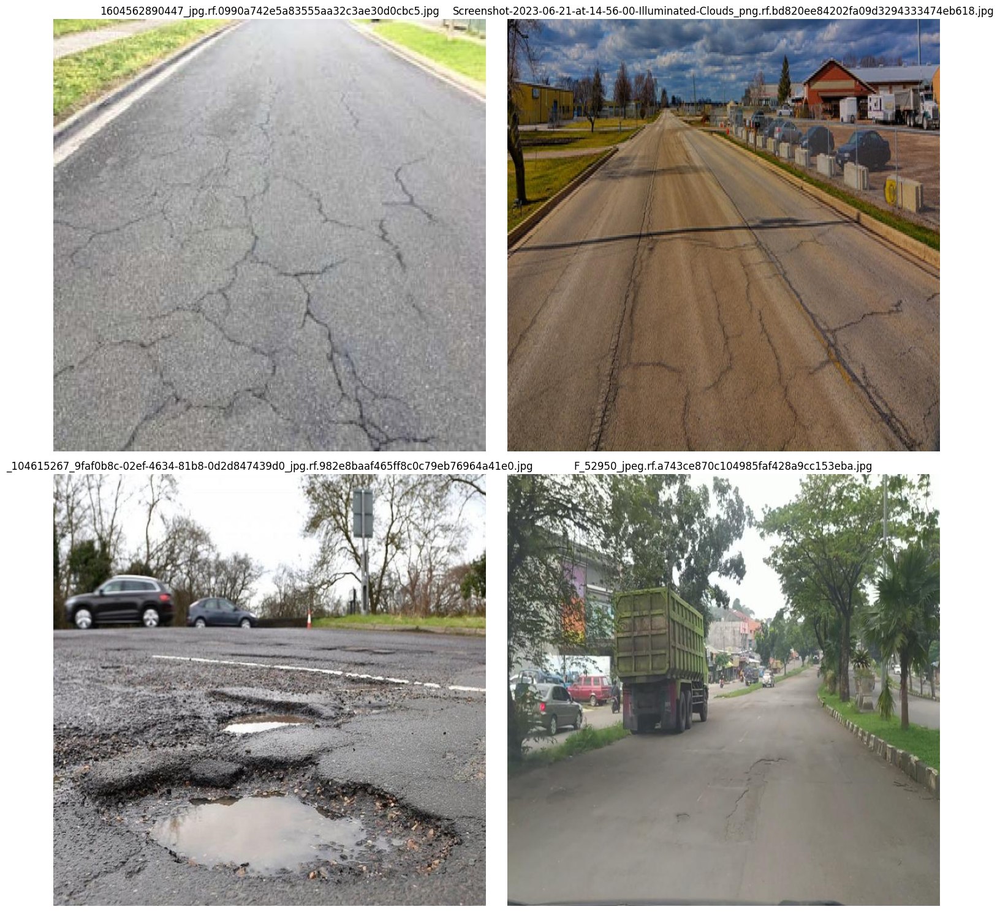

In [5]:
import os
import glob
import random
from PIL import Image
import matplotlib.pyplot as plt

# --- Configuration ---
# You can change this number to display more or fewer images
num_images_to_show = 4

# --- Get Image Paths ---
# The 'dataset' object from your Roboflow download code holds the location path.
# We'll build the path to the 'train' subfolder.
train_image_dir = os.path.join(dataset.location, "train")

# Use glob to get a list of all JPEG image files in the training directory
image_files = glob.glob(os.path.join(train_image_dir, "*.jpg"))

# --- Display Images ---
if not image_files:
    print(f"Error: No .jpg images found in '{train_image_dir}'. Please check the path.")
else:
    # Select a random sample of images from the list
    # This ensures you see different images each time you run the cell
    random_image_files = random.sample(image_files, min(num_images_to_show, len(image_files)))

    # Create a plot figure to display the images.
    # We'll create a 2x2 grid for 4 images.
    fig, axes = plt.subplots(2, 2, figsize=(15, 15))
    axes = axes.flatten()  # Flatten the 2x2 grid into a simple list of axes

    print(f"Displaying {len(random_image_files)} random images from the training set...")

    # Loop through the selected files and the subplots to display each image
    for i, img_path in enumerate(random_image_files):
        # Open the image file using the PIL library
        with Image.open(img_path) as img:
            # Display the image on its subplot
            axes[i].imshow(img)
            # Use the filename as the title for each subplot
            axes[i].set_title(os.path.basename(img_path), fontsize=12)
            # Turn off the axis markers
            axes[i].axis('off')

    # If you choose to show fewer than 4 images, this hides the empty subplots
    for j in range(i + 1, len(axes)):
        axes[j].axis('off')

    plt.tight_layout()
    plt.show()

# A SAMPLE IMAGE FROM THE VALID(VALIDATION) PART OF DATASET

Displaying 4 random images from the validation set...


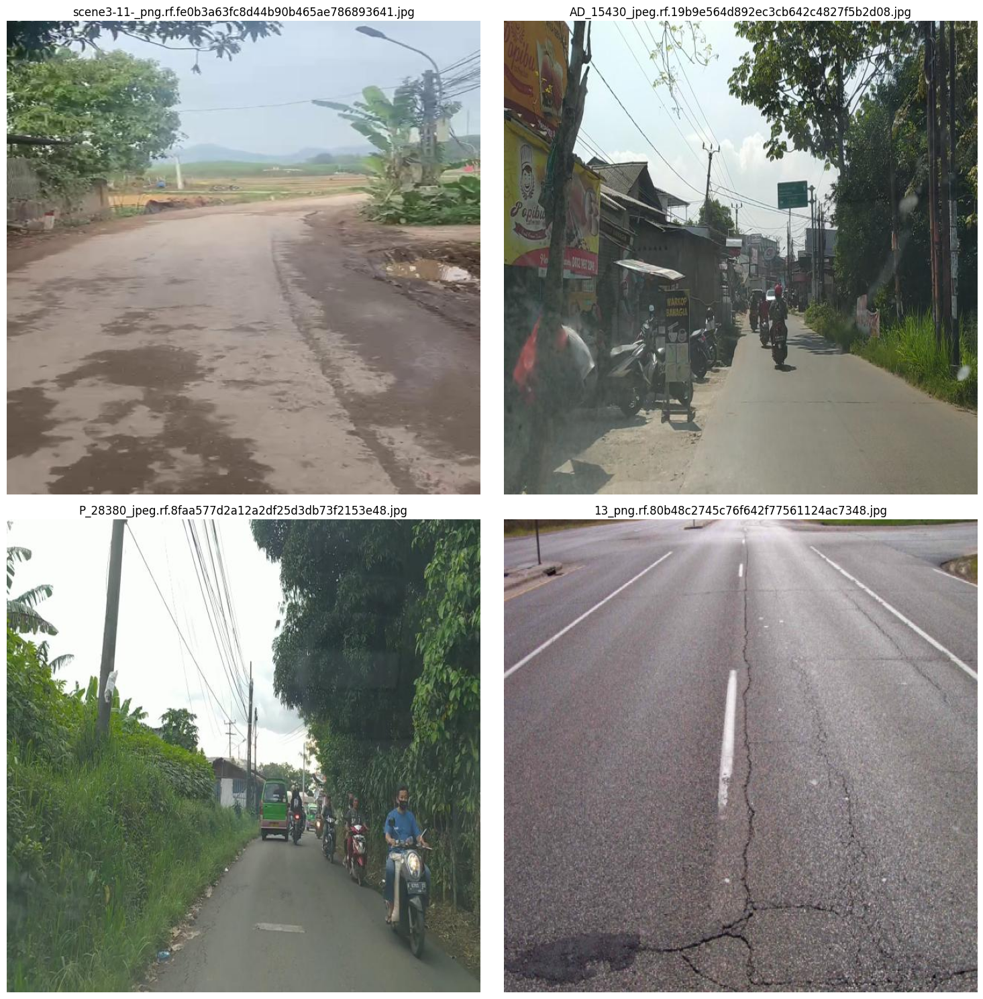

In [6]:
import os
import glob
import random
from PIL import Image
import matplotlib.pyplot as plt

# --- Configuration ---
num_images_to_show = 4

# --- Get Image Paths for the VALIDATION set ---
# The only change is pointing to the "valid" subfolder.
valid_image_dir = os.path.join(dataset.location, "valid")

# Use glob to get a list of all JPEG image files in the validation directory
image_files = glob.glob(os.path.join(valid_image_dir, "*.jpg"))

# --- Display Images ---
if not image_files:
    print(f"Error: No .jpg images found in '{valid_image_dir}'. Please check the path.")
else:
    # Select a random sample of images from the list
    random_image_files = random.sample(image_files, min(num_images_to_show, len(image_files)))

    # Create a plot figure to display the images
    fig, axes = plt.subplots(2, 2, figsize=(15, 15))
    axes = axes.flatten()

    print(f"Displaying {len(random_image_files)} random images from the validation set...")

    # Loop through the selected files and subplots to display each image
    for i, img_path in enumerate(random_image_files):
        with Image.open(img_path) as img:
            axes[i].imshow(img)
            axes[i].set_title(os.path.basename(img_path), fontsize=12)
            axes[i].axis('off')

    # Hide any unused subplots
    for j in range(i + 1, len(axes)):
        axes[j].axis('off')

    plt.tight_layout()
    plt.show()

# A SAMPLE IMAGE FROM THE TEST PART OF DATASET

Displaying 4 random images from the test set...


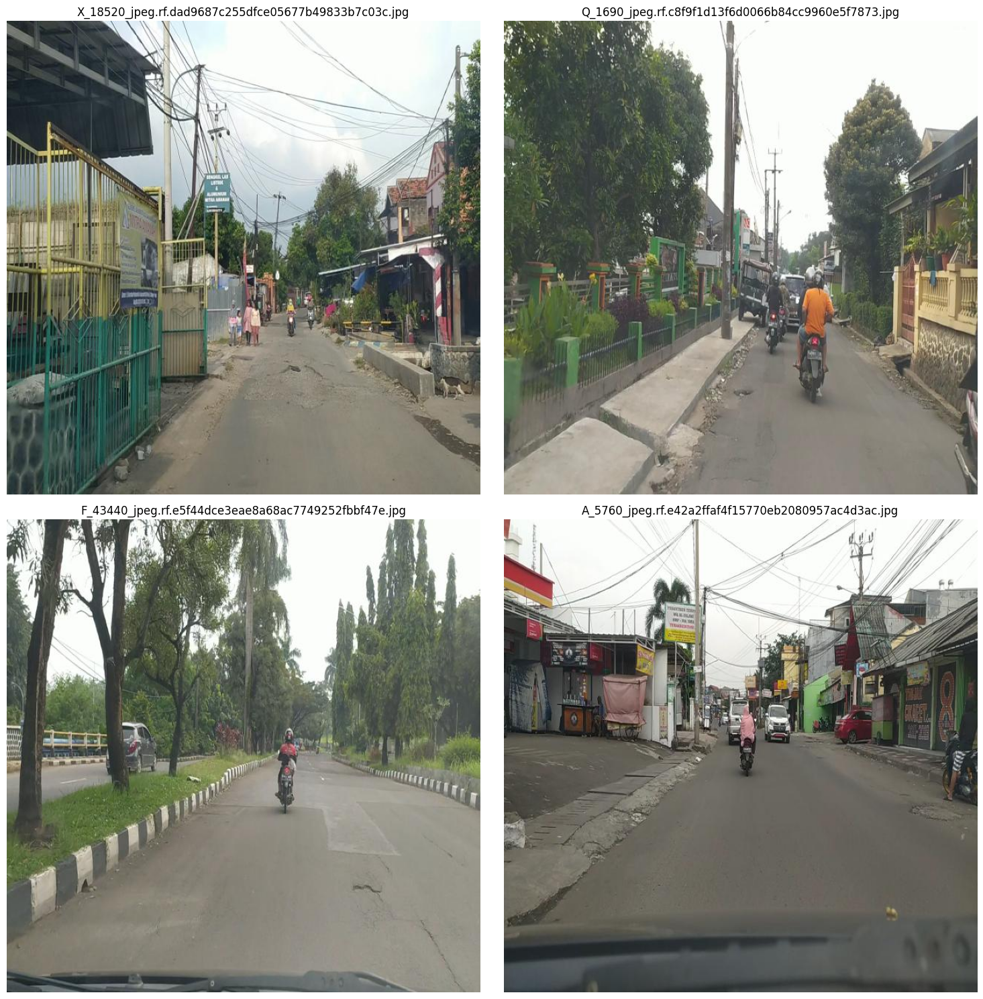

In [7]:
import os
import glob
import random
from PIL import Image
import matplotlib.pyplot as plt

# --- Configuration ---
num_images_to_show = 4

# --- Get Image Paths for the TEST set ---
# Here, we just point to the "test" subfolder.
test_image_dir = os.path.join(dataset.location, "test")

# Use glob to get a list of all JPEG image files in the test directory
image_files = glob.glob(os.path.join(test_image_dir, "*.jpg"))

# --- Display Images ---
if not image_files:
    print(f"Error: No .jpg images found in '{test_image_dir}'. Please check the path.")
else:
    # Select a random sample of images from the list
    random_image_files = random.sample(image_files, min(num_images_to_show, len(image_files)))

    # Create a plot figure to display the images
    fig, axes = plt.subplots(2, 2, figsize=(15, 15))
    axes = axes.flatten()

    print(f"Displaying {len(random_image_files)} random images from the test set...")

    # Loop through the selected files and subplots to display each image
    for i, img_path in enumerate(random_image_files):
        with Image.open(img_path) as img:
            axes[i].imshow(img)
            axes[i].set_title(os.path.basename(img_path), fontsize=12)
            axes[i].axis('off')

    # Hide any unused subplots
    for j in range(i + 1, len(axes)):
        axes[j].axis('off')

    plt.tight_layout()
    plt.show()

# A SAMPLE ANNOTATED IMAGE FROM THE PART OF DATASET

Displaying image: AH_15310_jpeg.rf.8819c1b3c052887f5b8acc713db0cd48.jpg
Found 3 annotations for this image.


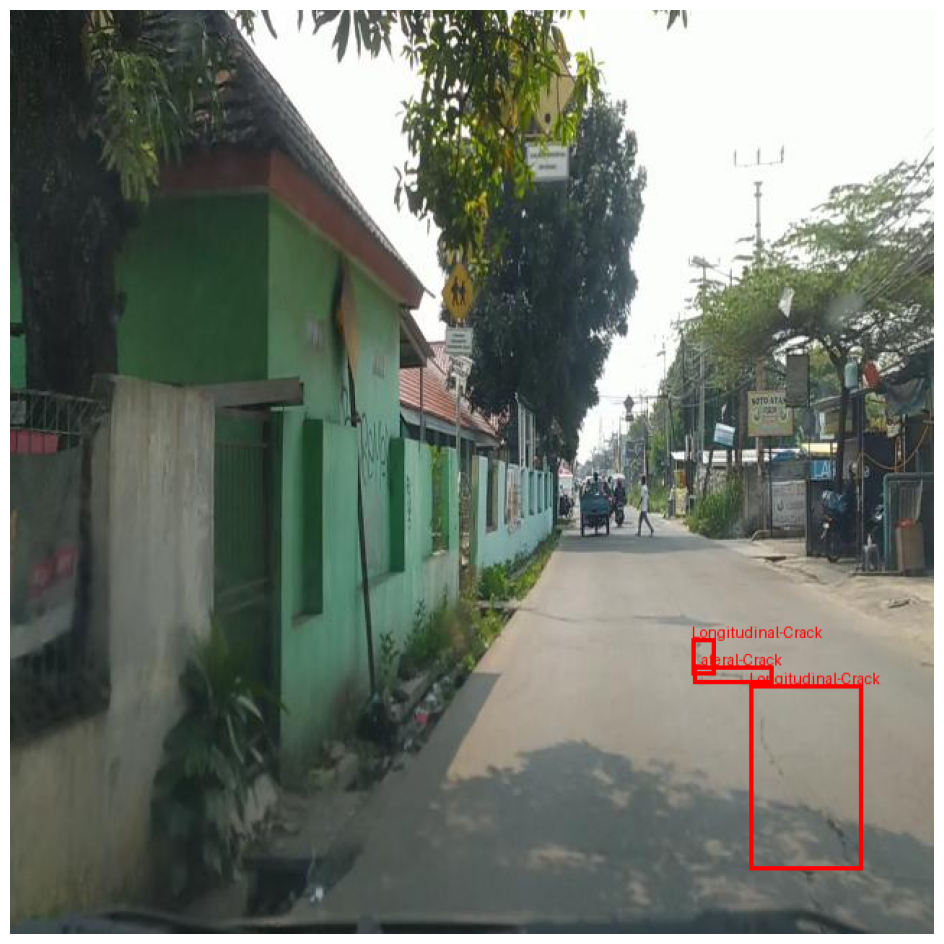

In [8]:
import os
import json
import random
from PIL import Image, ImageDraw
import matplotlib.pyplot as plt

# --- Load the Annotation File ---
# Define the path to your training annotations
train_annotations_path = os.path.join(dataset.location, "train", "_annotations.coco.json")
train_image_dir = os.path.join(dataset.location, "train")

# Open and load the JSON file into a Python dictionary
with open(train_annotations_path, 'r') as f:
    coco_data = json.load(f)

# --- Organize the Data for Easy Access ---
# Create dictionaries to easily look up image info, annotations, and categories
images = {image['id']: image for image in coco_data['images']}
annotations = {}
for ann in coco_data['annotations']:
    img_id = ann['image_id']
    if img_id not in annotations:
        annotations[img_id] = []
    annotations[img_id].append(ann)
categories = {cat['id']: cat['name'] for cat in coco_data['categories']}

# --- Select a Random Image and Draw Its Annotations ---
# Get a list of all image IDs that have annotations
annotated_image_ids = list(annotations.keys())
random_image_id = random.choice(annotated_image_ids)

# Get the image info (like the filename)
image_info = images[random_image_id]
image_path = os.path.join(train_image_dir, image_info['file_name'])

# Get all annotations for this image
image_annotations = annotations[random_image_id]

print(f"Displaying image: {image_info['file_name']}")
print(f"Found {len(image_annotations)} annotations for this image.")

# Open the image with PIL
with Image.open(image_path) as img:
    # Create a 'Draw' object to draw on the image
    draw = ImageDraw.Draw(img)

    # Loop through each annotation for the selected image
    for ann in image_annotations:
        # Get the bounding box coordinates [x, y, width, height]
        bbox = ann['bbox']
        x, y, w, h = bbox

        # Get the category name
        category_id = ann['category_id']
        category_name = categories[category_id]

        # Draw the rectangle
        # The rectangle method needs [x1, y1, x2, y2]
        draw.rectangle([x, y, x + w, y + h], outline="red", width=3)

        # Draw the label text
        draw.text((x, y - 10), category_name, fill="red")

    # --- Display the Final Image ---
    plt.figure(figsize=(12, 12))
    plt.imshow(img)
    plt.axis('off')
    plt.show()

In [9]:
!nvidia-smi

Sat Sep 20 19:59:01 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   58C    P8             10W /   70W |       2MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

# TRAINING FOR 5 EPOCHS

In [10]:
# ==============================================================================
# INSTALL AND IMPORT TQDM FOR PROGRESS BARS
# ==============================================================================
!pip install -q tqdm
from tqdm.notebook import tqdm
import os
import json
import torch
from torch.utils.data import Dataset, DataLoader
from PIL import Image
from transformers import DetrImageProcessor

# ==============================================================================
# SECTION 1: CREATE THE PYTORCH DATASET (No changes here)
# ==============================================================================

class CocoDetectionDataset(Dataset):
    def __init__(self, image_dir, annotation_file, processor):
        self.image_dir = image_dir
        self.processor = processor

        with open(annotation_file, 'r') as f:
            self.coco_data = json.load(f)

        self.categories = {cat['id']: cat for cat in self.coco_data['categories']}
        self.cat_id_to_int = {cat_id: i for i, cat_id in enumerate(self.categories.keys())}

        self.annotations = {}
        for ann in self.coco_data['annotations']:
            img_id = ann['image_id']
            if img_id not in self.annotations:
                self.annotations[img_id] = []
            self.annotations[img_id].append(ann)

        self.image_infos = [img for img in self.coco_data['images'] if img['id'] in self.annotations]

    def __len__(self):
        return len(self.image_infos)

    def __getitem__(self, idx):
        image_info = self.image_infos[idx]
        image_path = os.path.join(self.image_dir, image_info['file_name'])
        image = Image.open(image_path).convert("RGB")
        image_id = image_info['id']
        annotations_for_image = self.annotations[image_id]
        target = {'image_id': image_id, 'annotations': []}
        for ann in annotations_for_image:
            bbox = ann['bbox']
            category_id = ann['category_id']
            class_label = self.cat_id_to_int[category_id]
            target['annotations'].append({
                'bbox': bbox,
                'category_id': class_label,
                'area': ann['area'],
                'iscrowd': ann['iscrowd'],
                'image_id': image_id
            })
        encoding = self.processor(images=image, annotations=target, return_tensors="pt")
        pixel_values = encoding["pixel_values"].squeeze()
        labels = encoding["labels"][0]
        return {"pixel_values": pixel_values, "labels": labels}

# ==============================================================================
# SECTION 2: DEFINE THE COLLATE FUNCTION (No changes here)
# ==============================================================================

def collate_fn(batch):
    pixel_values = [item["pixel_values"] for item in batch]
    encoding = image_processor.pad(pixel_values, return_tensors="pt")
    labels = [item["labels"] for item in batch]
    return {
        'pixel_values': encoding['pixel_values'],
        'pixel_mask': encoding['pixel_mask'],
        'labels': labels
    }

# ==============================================================================
# SECTION 3: INSTANTIATE DATASETS AND DATALOADERS (No changes here)
# ==============================================================================
train_image_dir = os.path.join(dataset.location, "train")
train_ann_file = os.path.join(dataset.location, "train", "_annotations.coco.json")
valid_image_dir = os.path.join(dataset.location, "valid")
valid_ann_file = os.path.join(dataset.location, "valid", "_annotations.coco.json")
train_dataset = CocoDetectionDataset(image_dir=train_image_dir, annotation_file=train_ann_file, processor=image_processor)
valid_dataset = CocoDetectionDataset(image_dir=valid_image_dir, annotation_file=valid_ann_file, processor=image_processor)
print(f"Number of training examples: {len(train_dataset)}")
print(f"Number of validation examples: {len(valid_dataset)}")
train_dataloader = DataLoader(train_dataset, collate_fn=collate_fn, batch_size=4, shuffle=True)
valid_dataloader = DataLoader(valid_dataset, collate_fn=collate_fn, batch_size=4)

# ==============================================================================
# SECTION 4: THE MODIFIED TRAINING LOOP
# ==============================================================================
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)
optimizer = torch.optim.AdamW(model.parameters(), lr=1e-4, weight_decay=1e-4)
num_epochs = 5

print("\nStarting training...")

for epoch in range(num_epochs):
    model.train()
    train_loss = 0.0
    # MODIFICATION: Wrap the dataloader with tqdm for a progress bar
    for batch in tqdm(train_dataloader, desc=f"Training Epoch {epoch + 1}"):
        batch = {k: v.to(device) if isinstance(v, torch.Tensor) else [{kk: vv.to(device) for kk, vv in t.items()} for t in v] for k, v in batch.items()}
        outputs = model(**batch)
        loss = outputs.loss
        train_loss += loss.item()
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

    avg_train_loss = train_loss / len(train_dataloader)
    print(f"Epoch {epoch + 1}/{num_epochs} - Training Loss: {avg_train_loss:.4f}")

    model.eval()
    valid_loss = 0.0
    with torch.no_grad():
        # MODIFICATION: Wrap the dataloader with tqdm for a progress bar
        for batch in tqdm(valid_dataloader, desc=f"Validation Epoch {epoch + 1}"):
            batch = {k: v.to(device) if isinstance(v, torch.Tensor) else [{kk: vv.to(device) for kk, vv in t.items()} for t in v] for k, v in batch.items()}
            outputs = model(**batch)
            loss = outputs.loss
            valid_loss += loss.item()

    avg_valid_loss = valid_loss / len(valid_dataloader)
    print(f"Epoch {epoch + 1}/{num_epochs} - Validation Loss: {avg_valid_loss:.4f}")

print("\nTraining complete!")
model.save_pretrained("./fine-tuned-detr-road-damage")
print("Model saved to './fine-tuned-detr-road-damage'")

Number of training examples: 3592
Number of validation examples: 814

Starting training...


Training Epoch 1:   0%|          | 0/898 [00:00<?, ?it/s]

Epoch 1/5 - Training Loss: 3.6025


Validation Epoch 1:   0%|          | 0/204 [00:00<?, ?it/s]

Epoch 1/5 - Validation Loss: 3.6486


Training Epoch 2:   0%|          | 0/898 [00:00<?, ?it/s]

Epoch 2/5 - Training Loss: 3.3105


Validation Epoch 2:   0%|          | 0/204 [00:00<?, ?it/s]

Epoch 2/5 - Validation Loss: 3.2578


Training Epoch 3:   0%|          | 0/898 [00:00<?, ?it/s]

Epoch 3/5 - Training Loss: 3.2388


Validation Epoch 3:   0%|          | 0/204 [00:00<?, ?it/s]

Epoch 3/5 - Validation Loss: 3.2678


Training Epoch 4:   0%|          | 0/898 [00:00<?, ?it/s]

Epoch 4/5 - Training Loss: 3.2873


Validation Epoch 4:   0%|          | 0/204 [00:00<?, ?it/s]

Epoch 4/5 - Validation Loss: 4.0767


Training Epoch 5:   0%|          | 0/898 [00:00<?, ?it/s]

Epoch 5/5 - Training Loss: 3.2885


Validation Epoch 5:   0%|          | 0/204 [00:00<?, ?it/s]

Epoch 5/5 - Validation Loss: 3.1907

Training complete!
Model saved to './fine-tuned-detr-road-damage'


# TRAINING FOR 20 EPOCHS

In [21]:
# ==============================================================================
# INSTALL AND IMPORT TQDM FOR PROGRESS BARS
# ==============================================================================
!pip install -q tqdm
from tqdm.notebook import tqdm
import os
import json
import torch
from torch.utils.data import Dataset, DataLoader
from PIL import Image
from transformers import DetrImageProcessor

# REMOVED: The incorrect 'import float' line.

# ==============================================================================
# SECTION 1: CREATE THE PYTORCH DATASET (No changes here)
# ==============================================================================
class CocoDetectionDataset(Dataset):
    def __init__(self, image_dir, annotation_file, processor):
        self.image_dir = image_dir
        self.processor = processor
        with open(annotation_file, 'r') as f:
            self.coco_data = json.load(f)
        self.categories = {cat['id']: cat for cat in self.coco_data['categories']}
        self.cat_id_to_int = {cat_id: i for i, cat_id in enumerate(self.categories.keys())}
        self.annotations = {}
        for ann in self.coco_data['annotations']:
            img_id = ann['image_id']
            if img_id not in self.annotations:
                self.annotations[img_id] = []
            self.annotations[img_id].append(ann)
        self.image_infos = [img for img in self.coco_data['images'] if img['id'] in self.annotations]
    def __len__(self):
        return len(self.image_infos)
    def __getitem__(self, idx):
        image_info = self.image_infos[idx]
        image_path = os.path.join(self.image_dir, image_info['file_name'])
        image = Image.open(image_path).convert("RGB")
        image_id = image_info['id']
        annotations_for_image = self.annotations[image_id]
        target = {'image_id': image_id, 'annotations': []}
        for ann in annotations_for_image:
            bbox = ann['bbox']
            category_id = ann['category_id']
            class_label = self.cat_id_to_int[category_id]
            target['annotations'].append({'bbox': bbox, 'category_id': class_label, 'area': ann['area'], 'iscrowd': ann['iscrowd'], 'image_id': image_id})
        encoding = self.processor(images=image, annotations=target, return_tensors="pt")
        pixel_values = encoding["pixel_values"].squeeze()
        labels = encoding["labels"][0]
        return {"pixel_values": pixel_values, "labels": labels}

# ==============================================================================
# SECTION 2: DEFINE THE COLLATE FUNCTION (No changes here)
# ==============================================================================
def collate_fn(batch):
    pixel_values = [item["pixel_values"] for item in batch]
    encoding = image_processor.pad(pixel_values, return_tensors="pt")
    labels = [item["labels"] for item in batch]
    return {'pixel_values': encoding['pixel_values'], 'pixel_mask': encoding['pixel_mask'], 'labels': labels}

# ==============================================================================
# SECTION 3: INSTANTIATE DATASETS AND DATALOADERS (No changes here)
# ==============================================================================
train_image_dir = os.path.join(dataset.location, "train")
train_ann_file = os.path.join(dataset.location, "train", "_annotations.coco.json")
valid_image_dir = os.path.join(dataset.location, "valid")
valid_ann_file = os.path.join(dataset.location, "valid", "_annotations.coco.json")
train_dataset = CocoDetectionDataset(image_dir=train_image_dir, annotation_file=train_ann_file, processor=image_processor)
valid_dataset = CocoDetectionDataset(image_dir=valid_image_dir, annotation_file=valid_ann_file, processor=image_processor)
print(f"Number of training examples: {len(train_dataset)}")
print(f"Number of validation examples: {len(valid_dataset)}")
train_dataloader = DataLoader(train_dataset, collate_fn=collate_fn, batch_size=4, shuffle=True)
valid_dataloader = DataLoader(valid_dataset, collate_fn=collate_fn, batch_size=4)

# ==============================================================================
# SECTION 4: THE TRAINING LOOP WITH BEST MODEL SAVING
# ==============================================================================
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)
optimizer = torch.optim.AdamW(model.parameters(), lr=1e-4, weight_decay=1e-4)
num_epochs = 20

# A variable to track the best validation loss
best_valid_loss = float('inf')

print("\nStarting training...")

for epoch in range(num_epochs):
    model.train()
    train_loss = 0.0
    for batch in tqdm(train_dataloader, desc=f"Training Epoch {epoch + 1}"):
        batch = {k: v.to(device) if isinstance(v, torch.Tensor) else [{kk: vv.to(device) for kk, vv in t.items()} for t in v] for k, v in batch.items()}
        outputs = model(**batch)
        loss = outputs.loss
        train_loss += loss.item()
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

    avg_train_loss = train_loss / len(train_dataloader)
    print(f"Epoch {epoch + 1}/{num_epochs} - Training Loss: {avg_train_loss:.4f}")

    model.eval()
    valid_loss = 0.0
    with torch.no_grad():
        for batch in tqdm(valid_dataloader, desc=f"Validation Epoch {epoch + 1}"):
            batch = {k: v.to(device) if isinstance(v, torch.Tensor) else [{kk: vv.to(device) for kk, vv in t.items()} for t in v] for k, v in batch.items()}
            outputs = model(**batch)
            loss = outputs.loss
            valid_loss += loss.item()

    avg_valid_loss = valid_loss / len(valid_dataloader)
    print(f"Epoch {epoch + 1}/{num_epochs} - Validation Loss: {avg_valid_loss:.4f}")

    if avg_valid_loss < best_valid_loss:
        best_valid_loss = avg_valid_loss
        model.save_pretrained("./best-road-damage-model")
        print(f"🏆 New best model saved! Validation loss improved to: {best_valid_loss:.4f}")

print("\nTraining complete!")
print(f"The best model was saved to './best-road-damage-model' with a validation loss of {best_valid_loss:.4f}")

Number of training examples: 3592
Number of validation examples: 814

Starting training...


Training Epoch 1:   0%|          | 0/898 [00:00<?, ?it/s]

Epoch 1/20 - Training Loss: 3.3606


Validation Epoch 1:   0%|          | 0/204 [00:00<?, ?it/s]

Epoch 1/20 - Validation Loss: 3.1853
🏆 New best model saved! Validation loss improved to: 3.1853


Training Epoch 2:   0%|          | 0/898 [00:00<?, ?it/s]

Epoch 2/20 - Training Loss: 3.2841


Validation Epoch 2:   0%|          | 0/204 [00:00<?, ?it/s]

Epoch 2/20 - Validation Loss: 5.1646


Training Epoch 3:   0%|          | 0/898 [00:00<?, ?it/s]

Epoch 3/20 - Training Loss: 3.2022


Validation Epoch 3:   0%|          | 0/204 [00:00<?, ?it/s]

Epoch 3/20 - Validation Loss: 5.7449


Training Epoch 4:   0%|          | 0/898 [00:00<?, ?it/s]

Epoch 4/20 - Training Loss: 3.1343


Validation Epoch 4:   0%|          | 0/204 [00:00<?, ?it/s]

Epoch 4/20 - Validation Loss: 4.7941


Training Epoch 5:   0%|          | 0/898 [00:00<?, ?it/s]

Epoch 5/20 - Training Loss: 3.1033


Validation Epoch 5:   0%|          | 0/204 [00:00<?, ?it/s]

Epoch 5/20 - Validation Loss: 5.9895


Training Epoch 6:   0%|          | 0/898 [00:00<?, ?it/s]

Epoch 6/20 - Training Loss: 3.0790


Validation Epoch 6:   0%|          | 0/204 [00:00<?, ?it/s]

Epoch 6/20 - Validation Loss: 6.1144


Training Epoch 7:   0%|          | 0/898 [00:00<?, ?it/s]

Epoch 7/20 - Training Loss: 3.1455


Validation Epoch 7:   0%|          | 0/204 [00:00<?, ?it/s]

Epoch 7/20 - Validation Loss: 4.2777


Training Epoch 8:   0%|          | 0/898 [00:00<?, ?it/s]

Epoch 8/20 - Training Loss: 3.1123


Validation Epoch 8:   0%|          | 0/204 [00:00<?, ?it/s]

Epoch 8/20 - Validation Loss: 5.9675


Training Epoch 9:   0%|          | 0/898 [00:00<?, ?it/s]

Epoch 9/20 - Training Loss: 3.0423


Validation Epoch 9:   0%|          | 0/204 [00:00<?, ?it/s]

Epoch 9/20 - Validation Loss: 6.5619


Training Epoch 10:   0%|          | 0/898 [00:00<?, ?it/s]

Epoch 10/20 - Training Loss: 3.0273


Validation Epoch 10:   0%|          | 0/204 [00:00<?, ?it/s]

Epoch 10/20 - Validation Loss: 5.3726


Training Epoch 11:   0%|          | 0/898 [00:00<?, ?it/s]

Epoch 11/20 - Training Loss: 3.0395


Validation Epoch 11:   0%|          | 0/204 [00:00<?, ?it/s]

Epoch 11/20 - Validation Loss: 7.4709


Training Epoch 12:   0%|          | 0/898 [00:00<?, ?it/s]

Epoch 12/20 - Training Loss: 3.0221


Validation Epoch 12:   0%|          | 0/204 [00:00<?, ?it/s]

Epoch 12/20 - Validation Loss: 6.4243


Training Epoch 13:   0%|          | 0/898 [00:00<?, ?it/s]

Epoch 13/20 - Training Loss: 3.0503


Validation Epoch 13:   0%|          | 0/204 [00:00<?, ?it/s]

Epoch 13/20 - Validation Loss: 7.1117


Training Epoch 14:   0%|          | 0/898 [00:00<?, ?it/s]

Epoch 14/20 - Training Loss: 3.0323


Validation Epoch 14:   0%|          | 0/204 [00:00<?, ?it/s]

Epoch 14/20 - Validation Loss: 6.6862


Training Epoch 15:   0%|          | 0/898 [00:00<?, ?it/s]

Epoch 15/20 - Training Loss: 3.0460


Validation Epoch 15:   0%|          | 0/204 [00:00<?, ?it/s]

Epoch 15/20 - Validation Loss: 6.5959


Training Epoch 16:   0%|          | 0/898 [00:00<?, ?it/s]

KeyboardInterrupt: 

# INFERENCE TESTING CELL

Fetching 1 files:   0%|          | 0/1 [00:00<?, ?it/s]

Fine-tuned model and processor loaded successfully.
Category mappings recreated.

Please upload an image to test:


Saving 00-27-_png.rf.09109332a47b2033065c3512e1a23975.jpg to 00-27-_png.rf.09109332a47b2033065c3512e1a23975 (1).jpg

Image '00-27-_png.rf.09109332a47b2033065c3512e1a23975 (1).jpg' uploaded. Running inference...
Found 3 objects with confidence > 0.25


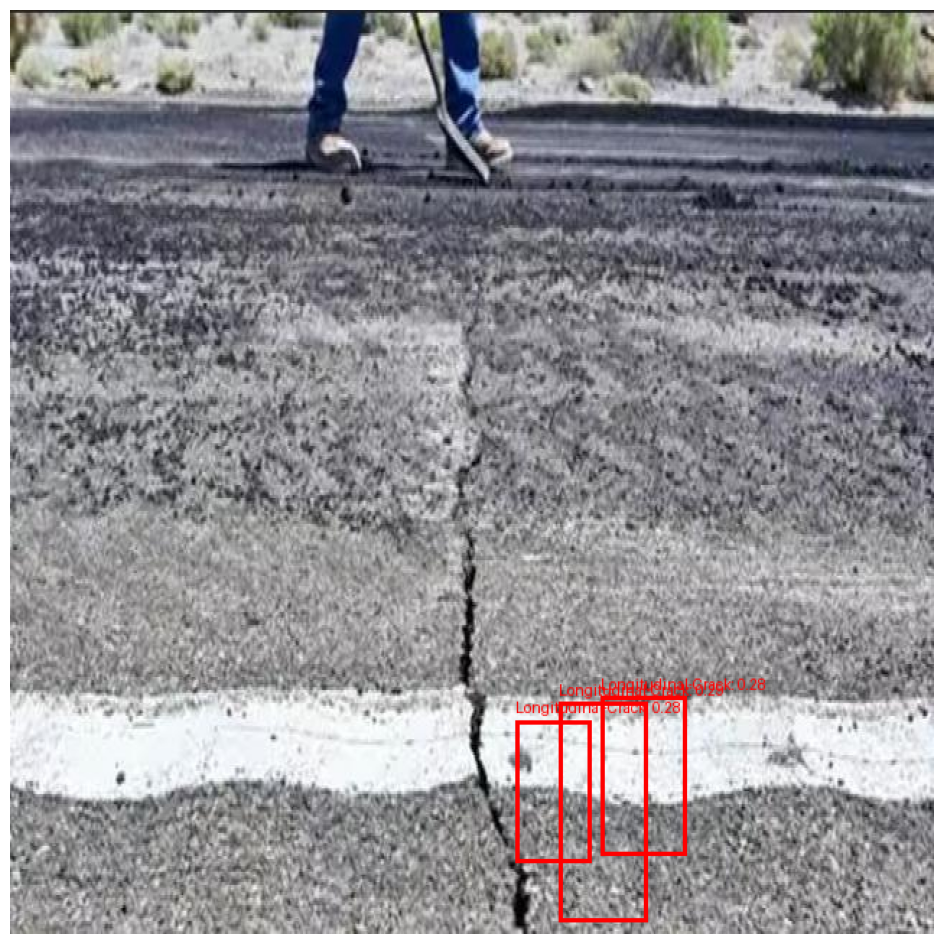

In [23]:
import torch
from transformers import DetrImageProcessor, DetrForObjectDetection
from google.colab import files
from PIL import Image, ImageDraw, ImageFont
import matplotlib.pyplot as plt
import os
import json

# ==============================================================================
# SECTION 1: LOAD YOUR FINE-TUNED MODEL AND PROCESSOR
# ==============================================================================
model_path = "./best-road-damage-model"
model = DetrForObjectDetection.from_pretrained(model_path)
image_processor = DetrImageProcessor.from_pretrained("facebook/detr-resnet-50")
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)
print("Fine-tuned model and processor loaded successfully.")

# ==============================================================================
# SECTION 2: RECREATE THE CATEGORY MAPPINGS (IMPROVED)
# ==============================================================================
train_ann_file = os.path.join(dataset.location, "train", "_annotations.coco.json")
with open(train_ann_file, 'r') as f:
    coco_data = json.load(f)

# IMPROVED: Simplified the logic for mapping category IDs to labels.
# The model outputs a 0-based index, so we create a map from that index to the class name.
categories = coco_data['categories']
int_to_label = {i: category['name'] for i, category in enumerate(categories)}
print("Category mappings recreated.")

# ==============================================================================
# SECTION 3: UPLOAD AND PREPARE YOUR IMAGE
# ==============================================================================
print("\nPlease upload an image to test:")
uploaded = files.upload()

if not uploaded:
    print("No file was uploaded. Please run the cell again.")
else:
    image_filename = next(iter(uploaded))
    image = Image.open(image_filename).convert("RGB")
    print(f"\nImage '{image_filename}' uploaded. Running inference...")

    # ==============================================================================
    # SECTION 4: PERFORM INFERENCE
    # ==============================================================================
    inputs = image_processor(images=image, return_tensors="pt").to(device)
    model.eval()
    with torch.no_grad():
        outputs = model(**inputs)

    # ==============================================================================
    # SECTION 5: VISUALIZE THE RESULTS
    # ==============================================================================
    target_sizes = torch.tensor([image.size[::-1]], device=device)

    # CHANGED: Lowered the confidence threshold to see more results.
    # A model trained for 5 epochs will not be very confident yet.
    CONFIDENCE_THRESHOLD = 0.25
    results = image_processor.post_process_object_detection(outputs, target_sizes=target_sizes, threshold=CONFIDENCE_THRESHOLD)[0]

    draw = ImageDraw.Draw(image)

    if len(results["scores"]) > 0:
        print(f"Found {len(results['scores'])} objects with confidence > {CONFIDENCE_THRESHOLD}")
        for score, label, box in zip(results["scores"], results["labels"], results["boxes"]):
            box = [round(i, 2) for i in box.tolist()]
            label_name = int_to_label.get(label.item(), "unknown")
            draw.rectangle(box, outline="red", width=3)
            label_text = f"{label_name}: {score.item():.2f}"
            draw.text((box[0], box[1] - 15), label_text, fill="red")
    else:
        print("No objects found with confidence >", CONFIDENCE_THRESHOLD)

    plt.figure(figsize=(12, 12))
    plt.imshow(image)
    plt.axis('off')
    plt.show()